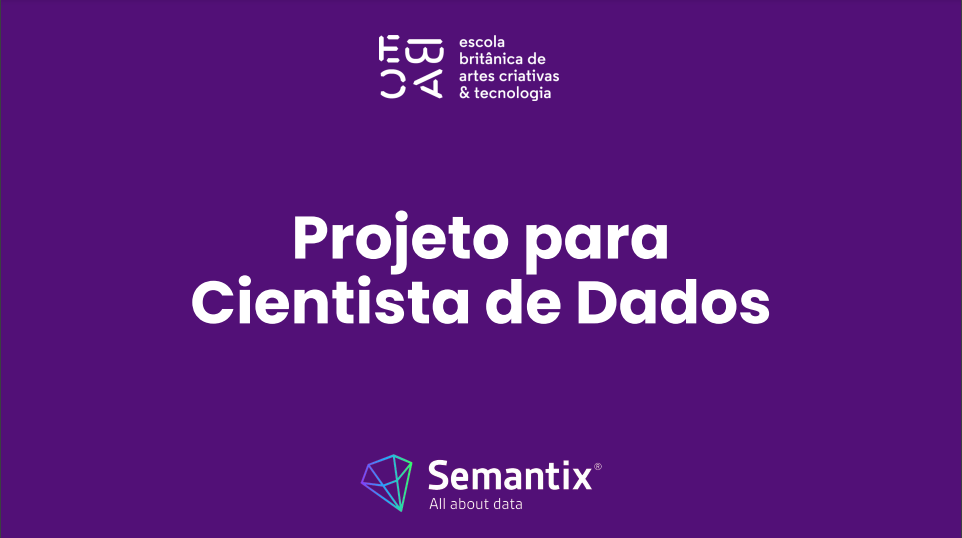


# Projeto Ciência de Dados - Semantix


<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    Análise e Predição de Doenças Cardiovasculares: Um Estudo Baseado no CRISP-DM
</div>


#### Descrição do Projeto
Este projeto utiliza o conjunto de dados Cardiovascular Disease para explorar, analisar e construir modelos de machine learning voltados à predição de doenças cardiovasculares. Por meio do processo CRISP-DM, abordaremos todas as etapas, desde a compreensão do problema de negócio até a implementação de modelos preditivos, avaliando o desempenho de diferentes algoritmos. O objetivo é não apenas construir modelos robustos, mas também fornecer insights práticos e interpretáveis que possam auxiliar na detecção precoce e na prevenção de doenças cardiovasculares.

Arquivon de dados: https://www.kaggle.com/datasets/sulianova/cardiovascular-disease-dataset/data

---

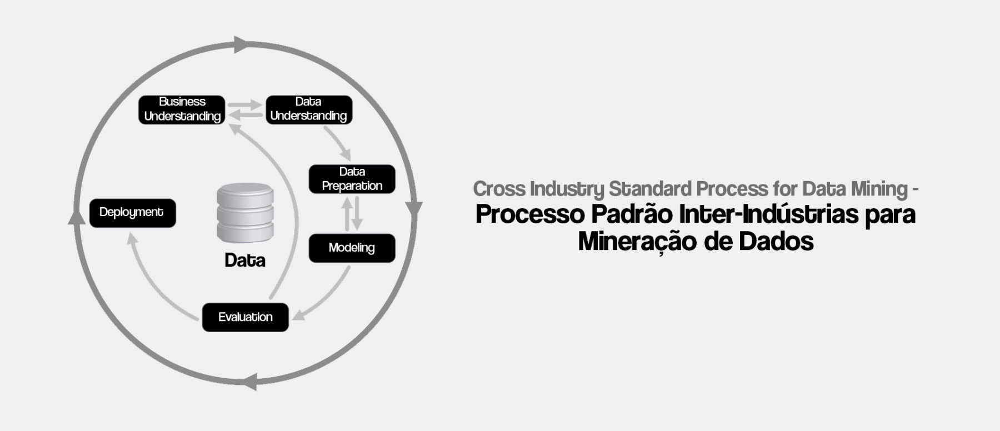

<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    O Modelo CRISP-DM
</div>


O CRISP-DM (Cross-Industry Standard Process for Data Mining) é um framework estruturado para conduzir projetos de análise de dados e machine learning. Ele é composto por seis etapas principais:

- Business Understanding (Entendimento do Negócio): Identificação dos objetivos do projeto e tradução para problemas analíticos.
- Data Understanding (Entendimento dos Dados): Coleta, descrição e exploração inicial dos dados disponíveis.
- Data Preparation (Preparação dos Dados): Limpeza, transformação e formatação dos dados para análise e modelagem.
- Modeling (Modelagem): Seleção e aplicação de algoritmos de machine learning, com ajustes de parâmetros.
- Evaluation (Avaliação): Análise crítica do desempenho dos modelos para garantir que atendam aos objetivos do negócio.
- Deployment (Implementação): Aplicação dos modelos em um ambiente real, com comunicação de resultados e insights.
Cada etapa desempenha um papel essencial para garantir que o projeto seja bem-sucedido e gere valor significativo.

## Etapa 1 CRISP-DM:

<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    Business Understanding
</div>


**Objetivo do Projeto:**
O objetivo principal deste projeto é prever a presença ou ausência de doenças cardiovasculares com base em dados médicos objetivos, exames e informações subjetivas fornecidas pelos pacientes.

**Problemas de Negócio:**

Como identificar pacientes com maior risco de doenças cardiovasculares?
Quais características mais contribuem para a predição dessas doenças?
Como implementar modelos preditivos para apoiar decisões clínicas?

**Questões Analíticas:**

Quais são as relações entre as variáveis do conjunto de dados e a ocorrência de doenças cardiovasculares?
Qual modelo preditivo apresenta melhor desempenho (acurácia, precisão, recall, etc.) no diagnóstico?
Quais insights podem ser extraídos para melhorar a prevenção de doenças cardiovasculares?

**Critérios de Sucesso:**

Construir modelos de machine learning com alta capacidade de predição.
Gerar relatórios interpretáveis com insights práticos.
Documentar as etapas do projeto de forma clara para compartilhamento e replicação no Kaggle.

## Etapa 2 CRISP-DM:

<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    Data Undestanding
</div>

A segunda etapa é o entendimento dos dados. Foram fornecidas 12 variáveis. O significado de cada uma dessas variáveis se encontra na tabela.

### Dicionário de Variáveis

| **Nome**                          | **Tipo de Informação**       | **Código**   | **Tipo de Dado**                                   |
|------------------------------------|------------------------------|--------------|---------------------------------------------------|
| **Age**                           | Objective Feature            | `age`        | int (dias)                                       |
| **Height**                        | Objective Feature            | `height`     | int (cm)                                         |
| **Weight**                        | Objective Feature            | `weight`     | float (kg)                                       |
| **Gender**                        | Objective Feature            | `gender`     | Código categórico                                |
| **Systolic blood pressure**       | Examination Feature          | `ap_hi`      | int                                              |
| **Diastolic blood pressure**      | Examination Feature          | `ap_lo`      | int                                              |
| **Cholesterol**                   | Examination Feature          | `cholesterol`| 1: normal, 2: acima do normal, 3: bem acima do normal |
| **Glucose**                       | Examination Feature          | `gluc`       | 1: normal, 2: acima do normal, 3: bem acima do normal |
| **Smoking**                       | Subjective Feature           | `smoke`      | binário                                          |
| **Alcohol intake**                | Subjective Feature           | `alco`       | binário                                          |
| **Physical activity**             | Subjective Feature           | `active`     | binário                                          |
| **Presence or absence of cardiovascular disease** | Target Variable            | `cardio`     | binário                           |
*           


Carregando os pacotes


In [4]:
import pandas as                      pd
import numpy as                       np
import seaborn as                     sns
import matplotlib.pyplot as           plt
import plotly.express as              px
import                                warnings
import                                shap
import xgboost as                     xgb

from ydata_profiling               import ProfileReport
from sklearn.model_selection       import cross_validate,learning_curve,ShuffleSplit, StratifiedKFold,train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model          import LogisticRegression
from sklearn.tree                  import DecisionTreeClassifier
from sklearn.ensemble              import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost                       import XGBClassifier
from sklearn.metrics               import roc_curve, ConfusionMatrixDisplay ,auc,accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, classification_report
from scipy.stats                   import uniform, randint
from sklearn.cluster               import KMeans
from sklearn.decomposition         import PCA
from sklearn.preprocessing         import MinMaxScaler
from scipy.spatial.distance        import cdist, pdist


warnings.filterwarnings("ignore")
%matplotlib inline

In [5]:

custom_params = {"axes.spines.right":False,"axes.spines.top":False}
sns.set_theme(style='ticks',rc=custom_params)

color_palette = ['#ae2e31','#10449e','#f55b5f', '#3aa3d9', '#f7372b', '#7ba0ec']

sns.set_palette(sns.color_palette(color_palette))
sns.set(rc={"axes.facecolor":"#e8e8e8","figure.facecolor":"#e8e8e8"})
print('Nossa paleta:')
sns.color_palette(color_palette)

Nossa paleta:


[(0.6823529411764706, 0.1803921568627451, 0.19215686274509805),
 (0.06274509803921569, 0.26666666666666666, 0.6196078431372549),
 (0.9607843137254902, 0.3568627450980392, 0.37254901960784315),
 (0.22745098039215686, 0.6392156862745098, 0.8509803921568627),
 (0.9686274509803922, 0.21568627450980393, 0.16862745098039217),
 (0.4823529411764706, 0.6274509803921569, 0.9254901960784314)]

Carregando os Dados:

O comando pd.read_csv é um comando da biblioteca pandas (pd.) e carrega os dados do arquivo csv indicado para um objeto dataframe do pandas.

In [6]:
df = pd.read_csv('cardio_train.csv',sep=';')

Verificando as linhas iniciais do nosso dado

In [4]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


Verificando agora as linhas finais

In [5]:
df.tail()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1
69999,99999,20540,1,170,72.0,120,80,2,1,0,0,1,0


---

Breve sumário estatístico sobre as variáveis 

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,70000.0,49972.419900,28851.302323,0.0,25006.75,50001.5,74889.25,99999.0
age,70000.0,19468.865814,2467.251667,10798.0,17664.00,19703.0,21327.00,23713.0
gender,70000.0,1.349571,0.476838,1.0,1.00,1.0,2.00,2.0
height,70000.0,164.359229,8.210126,55.0,159.00,165.0,170.00,250.0
weight,70000.0,74.205690,14.395757,10.0,65.00,72.0,82.00,200.0
ap_hi,70000.0,128.817286,154.011419,-150.0,120.00,120.0,140.00,16020.0
ap_lo,70000.0,96.630414,188.472530,-70.0,80.00,80.0,90.00,11000.0
cholesterol,70000.0,1.366871,0.680250,1.0,1.00,1.0,2.00,3.0
gluc,70000.0,1.226457,0.572270,1.0,1.00,1.0,1.00,3.0
smoke,70000.0,0.088129,0.283484,0.0,0.00,0.0,0.00,1.0


In [8]:
df.duplicated().sum()

0

Podemos observar que nossos dados já estão bem estruturados e no formato ideal para a criação de modelos de machine learning e também para fazer uma análise exploratória mais detalhada. Mas o que os dados acima nos diz é que não contém dados faltantes nem duplicados. Também nos informa uma distribuição razoável, que podemos observar com mais detalhes abaixo no `Profiling`

In [43]:
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [44]:
# Salvar o relatório como um arquivo HTML
profile.to_file("relatorio.html")

print("Relatório salvo como 'relatorio.html'. Faça upload do arquivo.")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Relatório salvo como 'relatorio.html'. Faça upload do arquivo.


---

### Visualizando a distribuição das variáveis Categoricas em relação a target

*Com objetivo de encontrar algum relação que influencie na previsão*

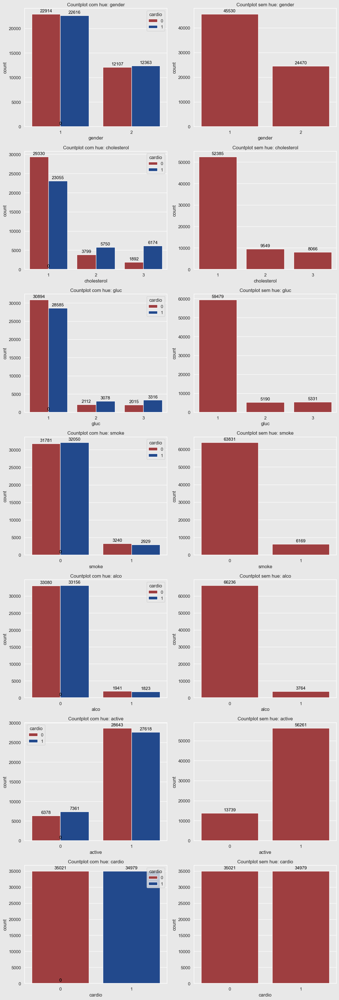

In [10]:
color_palette = ['#ae2e31','#10449e','#f55b5f', '#3aa3d9', '#f7372b', '#7ba0ec']

sns.set_palette(sns.color_palette(color_palette))


cat = df.loc[:, df.nunique() <= 3]
cat_var = cat.columns.tolist()

fig, axes = plt.subplots(nrows=len(cat_var), ncols=2, figsize=(12, 5 * len(cat_var)))

for idx, var in enumerate(cat_var):
    sns.countplot(data=df, x=var, hue='cardio', ax=axes[idx, 0])
    axes[idx, 0].set_title(f'Countplot com hue: {var}')
    for p in axes[idx, 0].patches:
        axes[idx, 0].annotate(
            f'{int(p.get_height())}',
            (p.get_x() + p.get_width() / 2., p.get_height()), 
            ha='center', va='baseline', fontsize=11, 
            color='black', xytext=(0, 5), textcoords='offset points'
        )
        
    sns.countplot(data=df, x=var, ax=axes[idx, 1])
    axes[idx, 1].set_title(f'Countplot sem hue: {var}')
    for p in axes[idx, 1].patches:
        axes[idx, 1].annotate(
            f'{int(p.get_height())}',
            (p.get_x() + p.get_width() / 2., p.get_height()), 
            ha='center', va='baseline', fontsize=11, 
            color='black', xytext=(0, 5), textcoords='offset points'
        )

plt.tight_layout()
plt.show()


Basicamente não temos de vista assim nenhuma caracteristica predominante nos dados categóricos, os dados para target(presença de doença cardiovascular) comparado aos dados sem esse `hue`, não apresentam nenhum padrão específico.

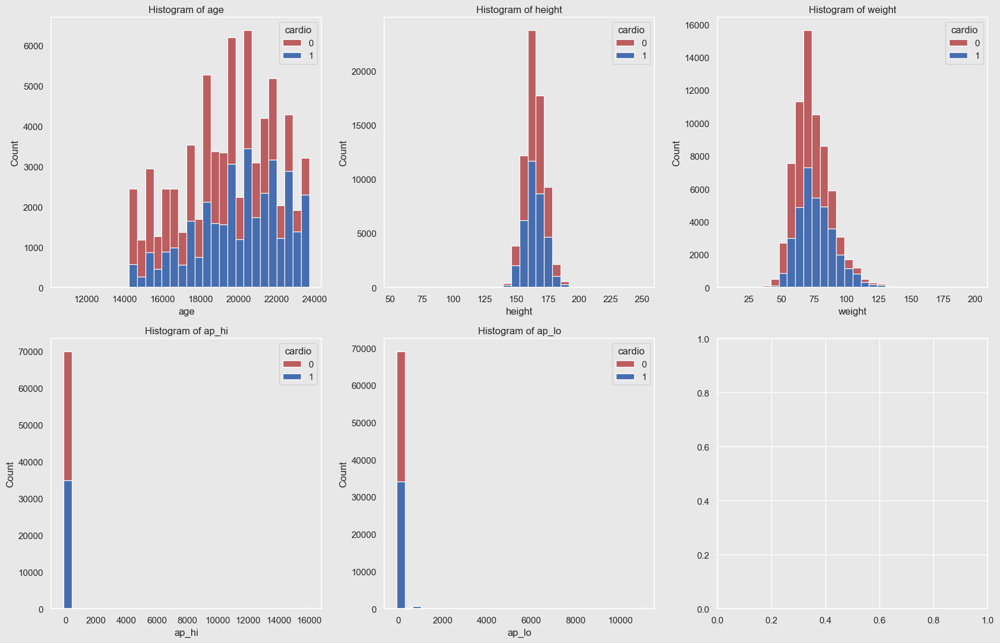

In [11]:
color_palette = ['#ae2e31','#10449e','#f55b5f', '#3aa3d9', '#f7372b', '#7ba0ec']
sns.set_palette(sns.color_palette(color_palette))

num_cols = df.loc[:,df.nunique()>3].drop(columns=['id']).columns
num_plots = len(num_cols)

fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(17, 11))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(data=df, x=col, hue='cardio', bins=30, ax=axes[i],multiple="stack")
    axes[i].set_title(f'Histogram of {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

In [12]:
fig = px.box(data_frame=df.loc[:,df.nunique()>3].drop(columns=['id']),x='ap_hi',template='simple_white')
fig.show()

In [13]:
fig = px.box(data_frame=df.loc[:,df.nunique()>3].drop(columns=['id']),x='ap_lo',template='simple_white')
fig.show()

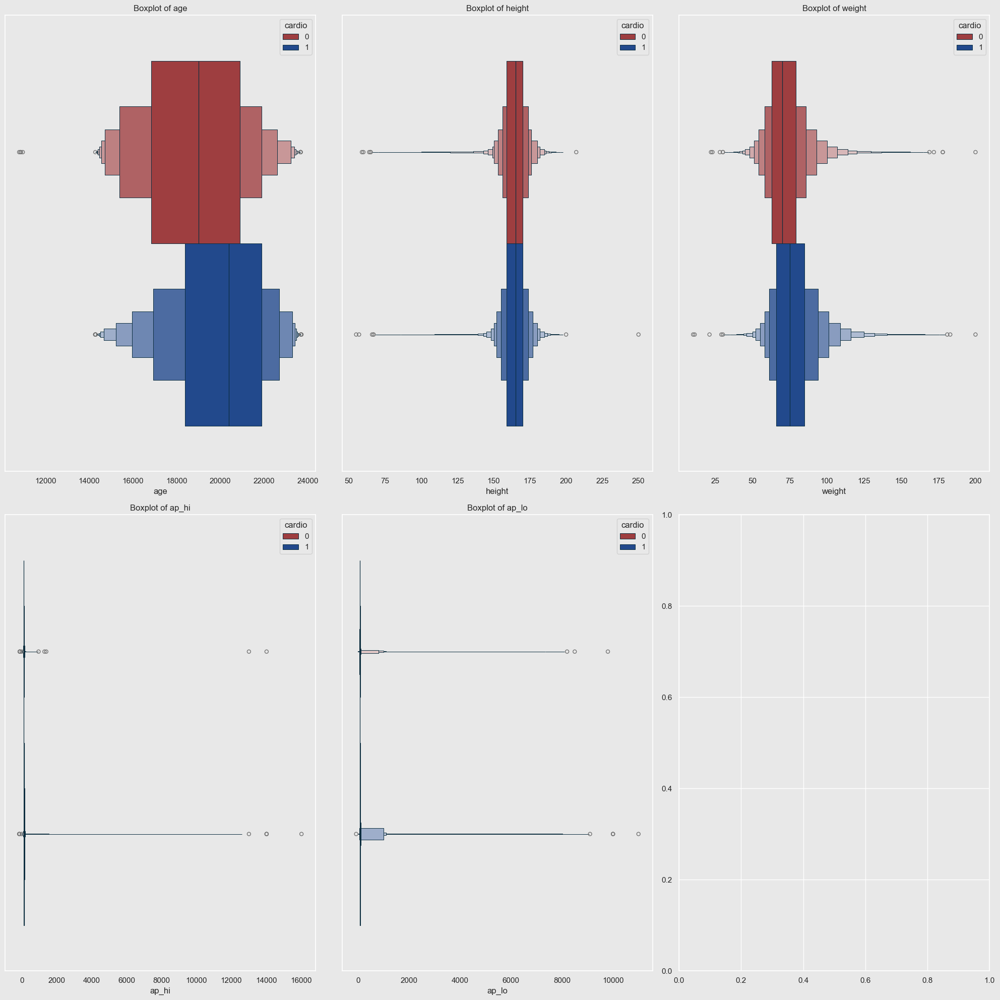

In [14]:
quant = df.select_dtypes(['int','float'])
quant_col = df.loc[:,df.nunique()>3].drop(columns=['id']).columns

fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.boxenplot(data=df, x=col,linecolor="#0b2d3e",hue='cardio', linewidth=.7, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

Aqui também podemos ver uma distribuição bem dentro do padrão, nada que explique e que seja um fator imenso para nossa avaliação. apenas a idade que parece ser uma variávem bem interessante, suas medianas tem valores um pouco distantes, o que soa bem interessante estatisticamente, nos faz entender que possivelmente a idade seja um dado que quanto maior, provavelmente aumenta o risco.

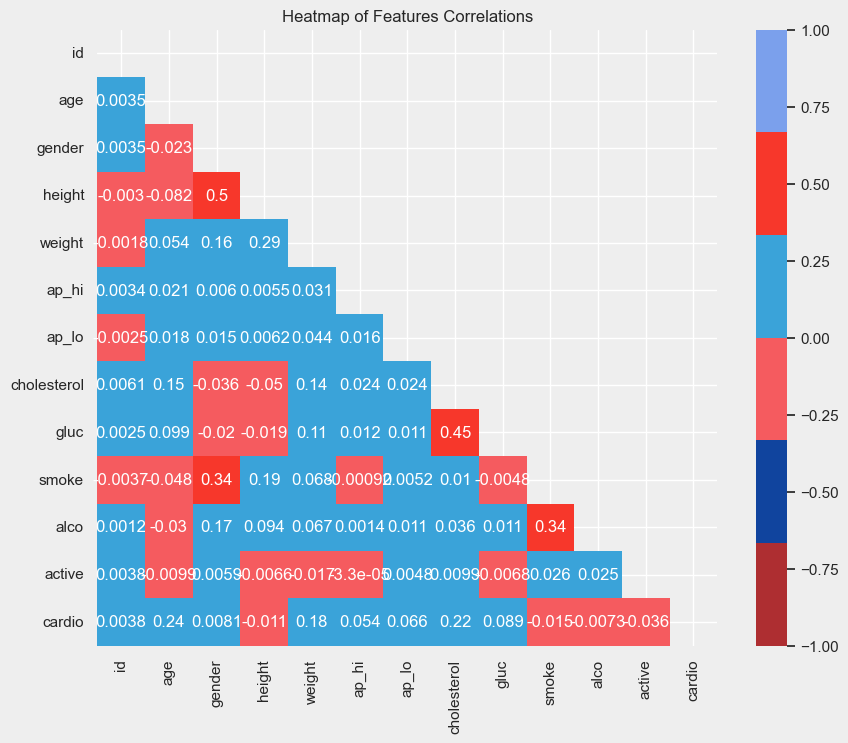

In [15]:
sns.set(rc={"axes.facecolor":"#eeeeee","figure.facecolor":"#eeeeee"})

# Calculando a matriz de correlação
corr = df.corr()

# Criando uma máscara para a metade inferior
mask = np.triu(np.ones_like(corr, dtype=bool))

# Plotando o heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask,cbar=True,annot=True,vmax=1,vmin=-1, cmap=sns.color_palette(color_palette, as_cmap=True))
plt.title('Heatmap of Features Correlations')
plt.show()

Ja aqui na análise de correlação, confirma o que dissemos acima, não parece ter nenhuma variável com grandes correlações.

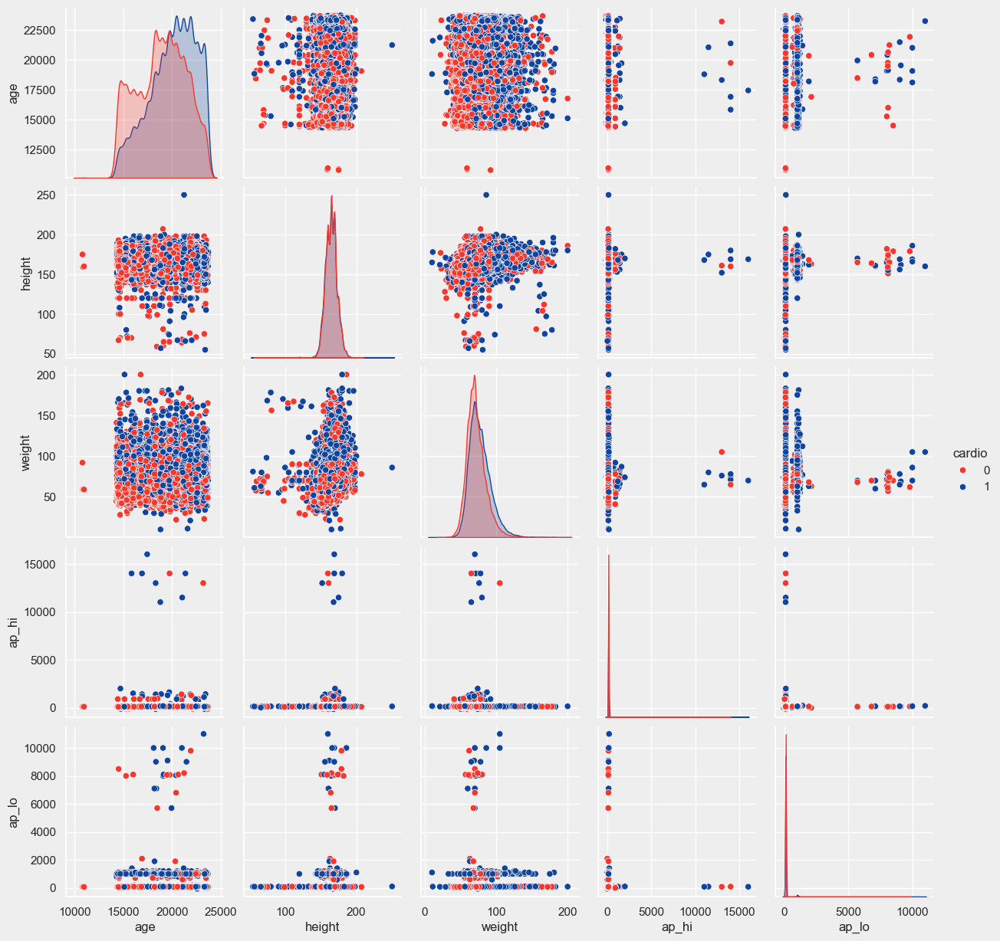

In [16]:
color_palette = ['#f7372b','#10449e','#f55b5f', '#3aa3d9', '#ae2e31', '#7ba0ec']
sns.set_palette(sns.color_palette(color_palette))

df_ = df.loc[:,df.nunique()>3].drop(columns=['id'])
df_['cardio'] = df['cardio']
sns.pairplot(df_,hue='cardio')
plt.show()

## Etapa 3 Crisp-DM: 

<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    Data Preparation
</div>

Nessa etapa realizamos tipicamente as seguintes operações com os dados:



- Seleção
- Limpeza
- Construção
- Integração
- Formatação

Porém, o nosso dado se encontra muito bem estruturado, encontra-se sem valores missings e sem dados duplicados. Todos os dados ja se encontram no padrão que os algoritmos ja sabem trabalhar que é o padrão numérico.A única coisa que irei fazer é alterar a variável de idade pois ela está sendo definida em dias, o que é confuso aos olhos de quem vê. E então podemos seguir para o desenvolvimento dos Algoritmos de Machine Learning.

In [17]:
df.age

0        18393
1        20228
2        18857
3        17623
4        17474
         ...  
69995    19240
69996    22601
69997    19066
69998    22431
69999    20540
Name: age, Length: 70000, dtype: int64

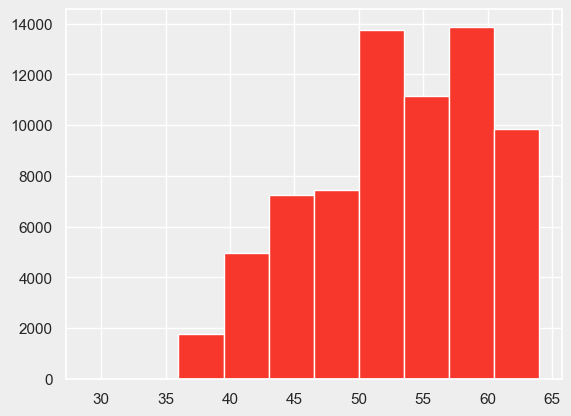

In [18]:
df.age = (df['age']/365).astype('int')
df.age.hist()
plt.show()

## Etapa 4 Crisp-DM: 

<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
    Modeling
</div>

*Na etapa de Modelagem do processo CRISP-DM, o objetivo é selecionar e ajustar os modelos que melhor se adequam ao problema em análise. Essa etapa envolve a aplicação de técnicas estatísticas e de machine learning para criar um modelo preditivo que ofereça os melhores resultados para a tarefa de classificação.*

---

**Descrição da Etapa:**

Nesta etapa, será realizada uma análise comparativa entre diferentes algoritmos de classificação para identificar qual deles apresenta o melhor desempenho em prever os resultados desejados. O processo incluirá as seguintes atividades principais:

**Divisão dos Dados e Validação Cruzada:**

Para garantir que o modelo não sofra de overfitting e que o desempenho seja consistente, será utilizada a técnica de Cross Validation (Validação Cruzada).
Dividiremos os dados em k subconjuntos (ou folds), utilizando cada um dos subconjuntos como dados de teste uma vez, enquanto os outros são usados para treinamento.
Esta abordagem garante que cada instância do dataset seja avaliada, proporcionando uma visão mais robusta do desempenho do modelo.

**Seleção de Algoritmos:**

Diferentes algoritmos de classificação serão aplicados, como:
- Árvores de Decisão
- Regressão Logística
- Random Forest
- Gradient Boosting
- AdaBoost
- XGBoost
Cada modelo será treinado utilizando os mesmos dados e avaliado sob as mesmas condições para garantir uma comparação justa.

**Métricas de Avaliação:**

As métricas utilizadas para comparar os modelos incluirão:

- Accuracy  
- Precision  
- Recall
- F1-Score
- AUC-ROC

**Ajuste de Hiperparâmetros:**
Com base na análise, será escolhido o modelo que apresenta o melhor equilíbrio entre desempenho e aplicabilidade no contexto do problema.
Para o modelo que melhor desempenhar nos dados de teste, será feito um tunning nos hiperparâmetros em busca do melhor modelo possivel.
Essa etapa é crucial para garantir que o modelo escolhido seja confiável, robusto e alinhado aos objetivos do projeto. O uso de validação cruzada e a comparação detalhada entre os modelos ajudam a mitigar riscos e fornecem uma base sólida para a próxima etapa, que envolve a avaliação final do modelo no ambiente de produção.

In [19]:
color_palette = ['#f7372b','#10449e','#f55b5f', '#3aa3d9', '#ae2e31', '#7ba0ec']
sns.set_palette(sns.color_palette(color_palette))

def cross_validate_classification_models3(X, Y, cv=5):
    models = {
        'Logistic Regression': LogisticRegression(max_iter=10000),
        'Decision Tree': DecisionTreeClassifier(),
        'Random Forest': RandomForestClassifier(),
        'Gradient Boosting': GradientBoostingClassifier(),
        'AdaBoost': AdaBoostClassifier(),
        'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
    }

    scoring = {
        'accuracy': 'accuracy',
        'precision': 'precision',
        'recall': 'recall',
        'f1': 'f1',
        'roc_auc': 'roc_auc'
    }

    results = {
        'Model': [],
        'Mean Accuracy': [],
        'Mean Precision': [],
        'Mean Recall': [],
        'Mean F1-Score': [],
        'Mean AUC-ROC': []
    }

    kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)

    # Para as curvas ROC
    plt.figure(figsize=(10, 8))
    plt.title("Curvas ROC comparativas", fontsize=16)
    
    for name, model in models.items():
        print(f"Avaliando {name}...")
        scores = cross_validate(model, X, Y, cv=kf, scoring=scoring, n_jobs=1)

        results['Model'].append(name)
        results['Mean Accuracy'].append(np.mean(scores['test_accuracy']))
        results['Mean Precision'].append(np.mean(scores['test_precision']))
        results['Mean Recall'].append(np.mean(scores['test_recall']))
        results['Mean F1-Score'].append(np.mean(scores['test_f1']))
        results['Mean AUC-ROC'].append(np.mean(scores['test_roc_auc']))

        # Ajustar modelo em um único fold para a curva ROC
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)
        model.fit(X_train, Y_train)
        y_proba = model.predict_proba(X_test)[:, 1]  # Probabilidade positiva
        
        fpr, tpr, _ = roc_curve(Y_test, y_proba)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
    
    # Configurações da curva ROC
    plt.plot([0, 1], [0, 1], color="navy", linestyle="--")
    plt.xlabel("Taxa de Falsos Positivos", fontsize=12)
    plt.ylabel("Taxa de Verdadeiros Positivos", fontsize=12)
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(True)
    plt.show()

    # DataFrame com os resultados
    results_df = pd.DataFrame(results)

    # Melhor modelo
    best_model = results_df.loc[results_df['Mean Accuracy'].idxmax()]
    print("\n Melhor modelo com base na acurácia média:")
    display(best_model)

    # Barplot das métricas
    metrics = ['Mean Accuracy', 'Mean Precision', 'Mean Recall', 'Mean F1-Score', 'Mean AUC-ROC']
    results_df.plot(
        x='Model', 
        y=metrics, 
        kind='bar', 
        figsize=(12, 6), 
        title="Desempenho Médio dos Modelos"
    )
    plt.ylabel("Pontuação Média", fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    return results_df

In [7]:
X = df.drop(columns=['cardio','id'])
y = df[['cardio']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

Avaliando Logistic Regression...
Avaliando Decision Tree...
Avaliando Random Forest...
Avaliando Gradient Boosting...
Avaliando AdaBoost...
Avaliando XGBoost...


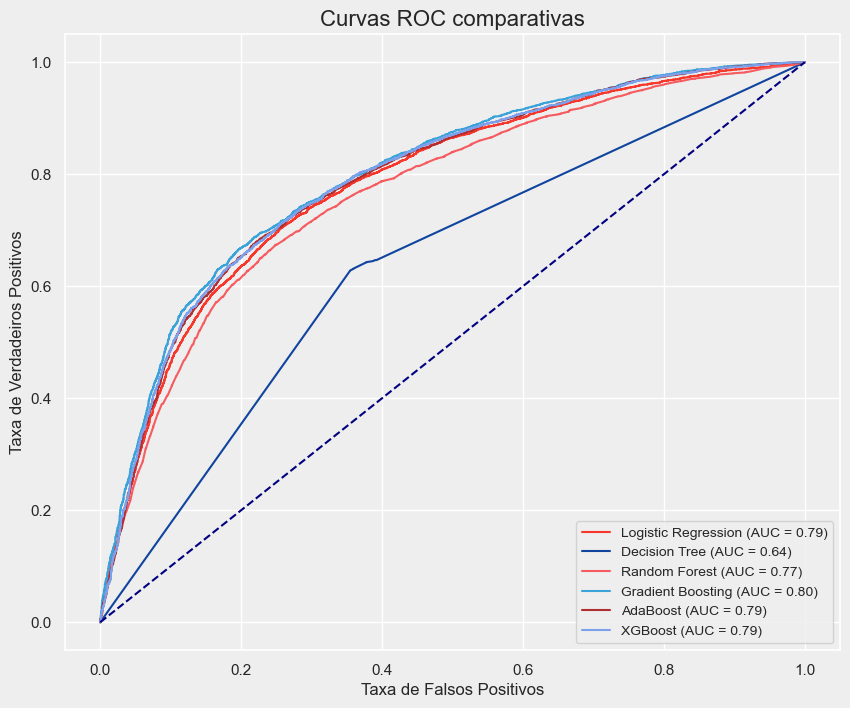


 Melhor modelo com base na acurácia média:


Model             Gradient Boosting
Mean Accuracy              0.736939
Mean Precision             0.757826
Mean Recall                0.696711
Mean F1-Score              0.725965
Mean AUC-ROC               0.803711
Name: 3, dtype: object

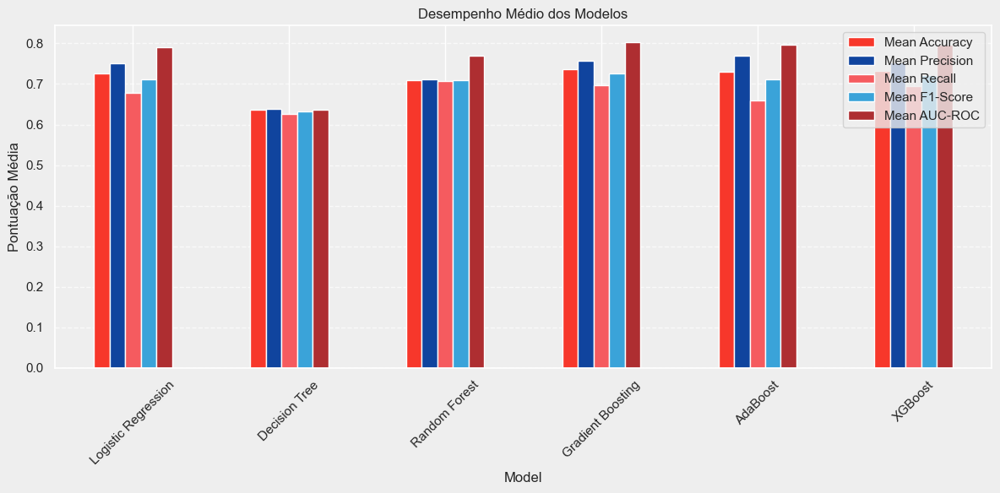

,Model,Mean Accuracy,Mean Precision,Mean Recall,Mean F1-Score,Mean AUC-ROC
0,Logistic Regression,0.726143,0.750478,0.677860,0.712299,0.789522
1,Decision Tree,0.635959,0.638770,0.626326,0.632459,0.636252
2,Random Forest,0.710102,0.711288,0.707646,0.709447,0.769033
3,Gradient Boosting,0.736939,0.757826,0.696711,0.725965,0.803711
4,AdaBoost,0.730837,0.768973,0.660193,0.710410,0.795848
5,XGBoost,0.732796,0.752545,0.693977,0.722062,0.796101


In [21]:
cross_validate_classification_models3(X_train,y_train,5)

#### Escolha do Modelo Final: XGBoost
Após realizar testes com diversos modelos de classificação, incluindo regressão logística, árvores de decisão, florestas aleatórias, AdaBoost, Gradient Boosting e XGBoost, foi decidido que o modelo final será baseado no XGBoost. A seguir, detalhamos os motivos para esta escolha e apresentamos uma análise comparativa.

**Razões para a Escolha do XGBoost**

Desempenho Geral e Eficiência Computacional:

- O XGBoost é uma evolução do Gradient Boosting, trazendo otimizações que tornam o treinamento mais rápido e eficiente, especialmente em conjuntos de dados maiores.
- Embora as métricas de avaliação entre o Gradient Boosting e o XGBoost sejam semelhantes, com uma diferença marginal na Mean Accuracy (0.728571 para o XGBoost contra 0.734041 do Gradient Boosting) e no AUC-ROC (0.794660   para o XGBoost contra 0.801235), o XGBoost foi preferido por oferecer desempenho computacional superior sem comprometer a qualidade do modelo.

Robustez e Flexibilidade:

- Assim como o Gradient Boosting, o XGBoost combina o aprendizado sequencial de vários classificadores fracos para criar um modelo forte.
- Adicionalmente, o XGBoost implementa técnicas avançadas, como regularização L1/L2 para evitar overfitting e uso de histogramas para acelerar o treinamento.

Interpretação de Resultados:

- O XGBoost permite a análise da importância das variáveis, fornecendo insights valiosos sobre os fatores que mais influenciam o modelo. Isso contribui para a interpretabilidade e facilita a explicação dos resultados obtidos.

Desempenho Comparativo:

- Em comparação com outros modelos testados, como AdaBoost e Gradient Boosting, o XGBoost apresentou desempenho muito próximo em métricas-chave como AUC-ROC e F1-Score, mas com a vantagem de um treinamento mais eficiente e maior escalabilidade.

Ajuste Fino:

- O XGBoost oferece diversos hiperparâmetros ajustáveis, como n_estimators, learning_rate, max_depth e colsample_bytree, que permitem aprimorar ainda mais o desempenho do modelo.
- Essas opções tornam o XGBoost extremamente versátil para problemas de classificação com dados complexos.

#### Vamos fazer um modelo Inicial com Grid Search e procurar a melhor combinação possivel dos nossos hiperparâmetros

In [22]:
xgb_model = XGBClassifier()

In [23]:
params = {
    'learning_rate' : [0.1,0.04,1],
    'n_estimators' : [100],
    'min_samples_leaf': [2, 10, 20],
    'max_depth':[4,6]
}

grid = GridSearchCV(estimator=xgb_model,
                    param_grid=params,
                    scoring='accuracy',
                    n_jobs=-1,
                    verbose=False,
                    cv=2)

In [24]:
grid.fit(X_train, y_train)

GridSearchCV(cv=2,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.04, 1], 'max_depth': [4, 6],
                         'min_samples_leaf': [2, 10, 20],
                         'n_estimators': [100]},
             scoring='accuracy', verbose=False)

In [25]:
model = grid.best_estimator_

In [26]:
def print_metricas(model):
    y_proba_train = grid.predict_proba(X_train)[:, 1]
    y_pred_train = grid.predict(X_train)
    
    # 2. Calcular métricas
    accuracy_train = accuracy_score(y_train, y_pred_train)
    roc_au_train = roc_auc_score(y_train, y_proba_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    
    # Exibir as métricas
    print(f"Acurácia Treino: {accuracy_train:.2f}")
    print(f"ROC-AUC Treino: {roc_au_train:.2f}")
    print(f"Precisão Treino: {precision_train:.2f}")
    print(f"Recall Treino: {recall_train:.2f}")
    print(f"F1: Treino: {f1_train:.2f}")
    
    y_proba_test = grid.predict_proba(X_test)[:, 1]
    y_pred_test = grid.predict(X_test)
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap='coolwarm');
    plt.show()
    print('-='*15)
    # 2. Calcular métricas
    accuracy_test = accuracy_score(y_test, y_pred_test)
    roc_au_testc = roc_auc_score(y_test, y_proba_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    
    # Exibir as métricas
    print(f"Acurácia Teste: {accuracy_test:.2f}")
    print(f"ROC-AUC Teste: {roc_au_testc:.2f}")
    print(f"Precisão Teste: {precision_test:.2f}")
    print(f"Recall Teste: {recall_test:.2f}")
    print(f"F1 Teste: {f1_test:.2f}")
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap='coolwarm');
    plt.show()

Acurácia Treino: 0.74
ROC-AUC Treino: 0.81
Precisão Treino: 0.77
Recall Treino: 0.70
F1: Treino: 0.73


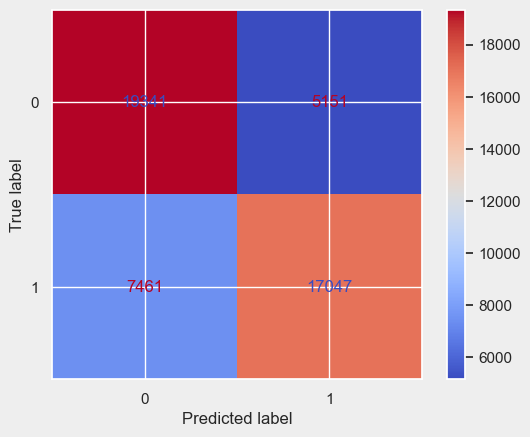

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Acurácia Teste: 0.73
ROC-AUC Teste: 0.80
Precisão Teste: 0.76
Recall Teste: 0.69
F1 Teste: 0.72


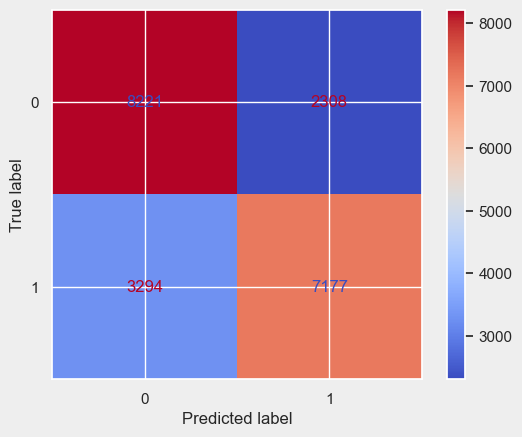

In [27]:
print_metricas(model)

In [28]:
params = {
    'learning_rate' : [0.1,0.2,0.5],
    'n_estimators' : [100,200],
    'min_samples_leaf': [2,12],
    'max_depth':[3,4,5]
}

grid = GridSearchCV(estimator=xgb_model,
                    param_grid=params,
                    scoring='accuracy',
                    n_jobs=-1,
                    verbose=False,
                    cv=2)
grid.fit(X_train, y_train)

GridSearchCV(cv=2,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.5],
                         'max_depth': [3, 4, 5], 'min_samples_leaf': [2, 12],
                         'n_estimators': [100, 200]},
             scoring='accuracy', verbose=False)

In [29]:
grid.best_params_

{'learning_rate': 0.2,
 'max_depth': 3,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [30]:
model = grid.best_estimator_

Acurácia Treino: 0.74
ROC-AUC Treino: 0.81
Precisão Treino: 0.76
Recall Treino: 0.70
F1: Treino: 0.73


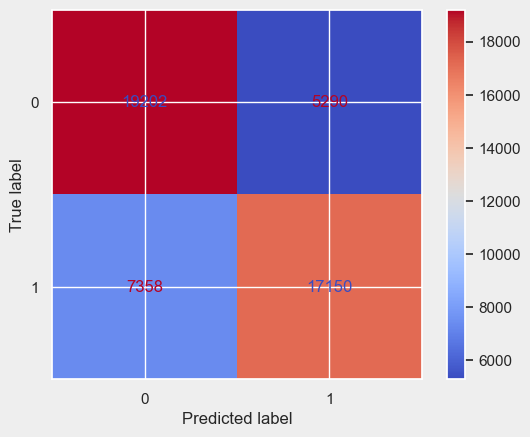

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Acurácia Teste: 0.73
ROC-AUC Teste: 0.80
Precisão Teste: 0.75
Recall Teste: 0.69
F1 Teste: 0.72


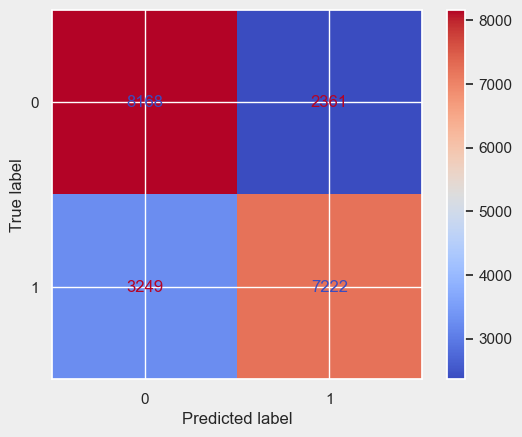

In [31]:
print_metricas(model)

In [32]:
params = {
    'learning_rate': uniform(0.01, 0.5),
    'n_estimators': randint(50, 500),
    'max_depth': randint(3, 10),
    'min_child_weight': randint(1, 10),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'gamma': uniform(0, 0.4)
}

random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=params,
    n_iter=100,
    scoring='roc_auc',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_train, y_train)
best_model = random_search.best_estimator_
print("Melhores Parâmetros:", random_search.best_params_)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Melhores Parâmetros: {'colsample_bytree': 0.8777755692715243, 'gamma': 0.09151926619664899, 'learning_rate': 0.0484899549143965, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 135, 'subsample': 0.9402339195076288}


Acurácia Treino: 0.74
ROC-AUC Treino: 0.81
Precisão Treino: 0.76
Recall Treino: 0.70
F1: Treino: 0.73


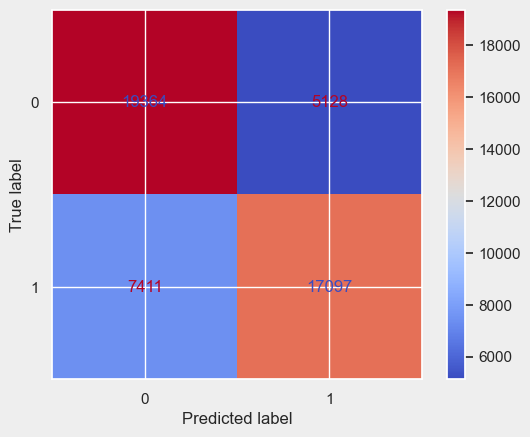

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Acurácia Teste: 0.73
ROC-AUC Teste: 0.80
Precisão Teste: 0.75
Recall Teste: 0.69
F1 Teste: 0.72


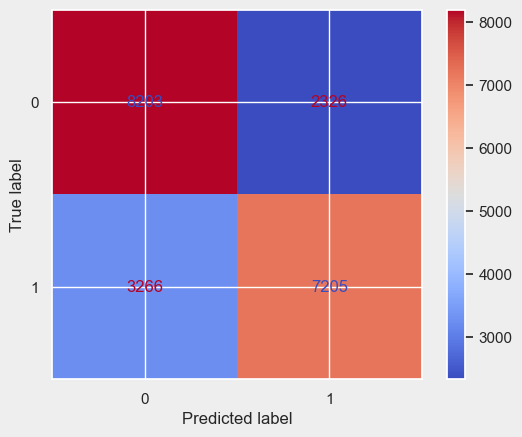

In [33]:
print_metricas(best_model)

Mesmo fazendo Tunning e alterando diversos Hiperparâmetros para testar outras combinações e observar em qual meu modelo mais se ajusta, ele segue desempenhando basicamente da mesma forma.

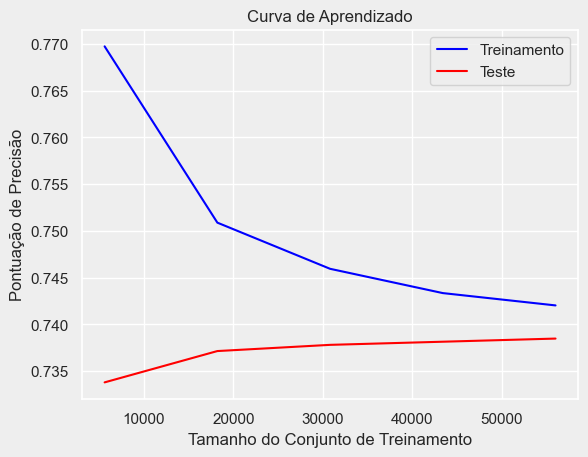

In [34]:
cv = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

train_sizes, train_scores, test_scores = learning_curve(best_model, X, y, cv=cv)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.plot(train_sizes, train_scores_mean, label="Treinamento", color="blue")
plt.plot(train_sizes, test_scores_mean, label="Teste", color="red")
plt.xlabel("Tamanho do Conjunto de Treinamento")
plt.ylabel("Pontuação de Precisão")
plt.title("Curva de Aprendizado")
plt.legend()
plt.show()

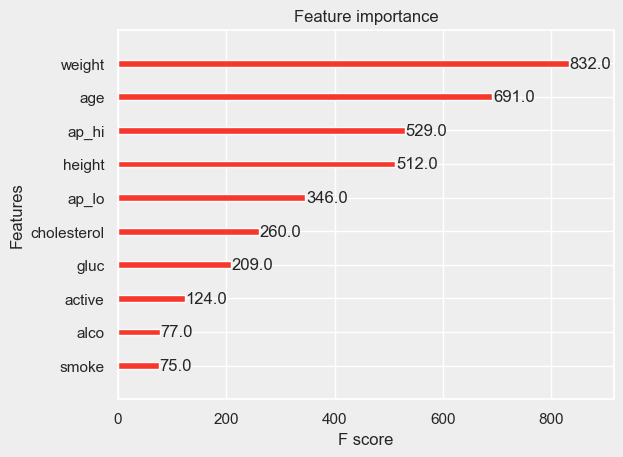

In [35]:
best_model.fit(X_train, y_train)
xgb.plot_importance(best_model, max_num_features=10)
plt.show()

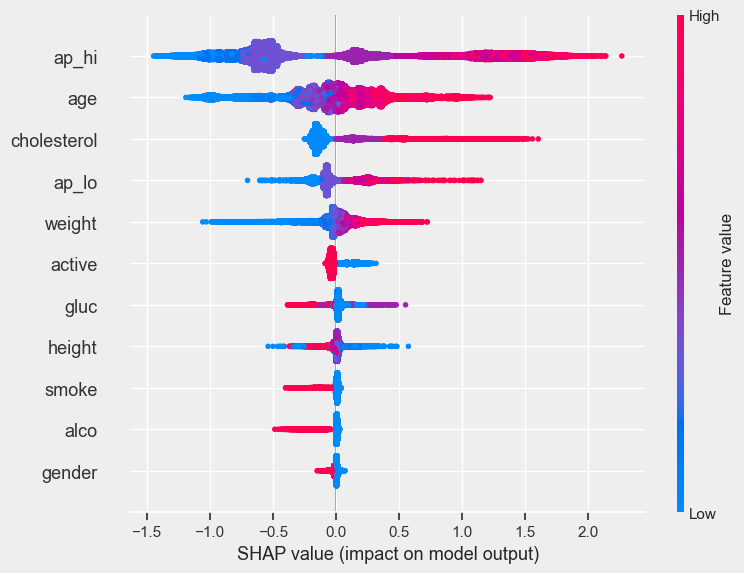

In [36]:
explainer = shap.TreeExplainer(best_model)

shap_values = explainer.shap_values(X)

if isinstance(shap_values, list):
    print(f"Este é um problema de classificação com {len(shap_values)} classes.")
    shap_values_to_plot = shap_values[1]
else:
    shap_values_to_plot = shap_values  

shap.summary_plot(shap_values_to_plot, X)


Este gráfico é um SHAP summary plot e é utilizado para explicar a importância e o impacto das variáveis em um modelo de machine learning. Ele é gerado utilizando os valores SHAP (SHapley Additive exPlanations), que fornecem explicações detalhadas sobre como cada variável está contribuindo para as previsões de um modelo.

### Estrutura do Gráfico:

- Eixo Y (variáveis): Cada linha corresponde a uma variável do dataset utilizada pelo modelo.
- Eixo X (valores SHAP): O impacto de uma variável na previsão. Valores positivos indicam que a variável contribuiu para aumentar a previsão, enquanto valores negativos indicam que diminuiu a previsão.
- Distribuição de pontos: Cada ponto representa o valor SHAP para uma amostra específica, mostrando como a variável impactou a previsão.
- Cor (feature value): Representa os valores da variável. Tons de vermelho indicam valores altos, e tons de azul indicam valores baixos.

### Como Interpretar o Gráfico:

Amplitude no eixo X: Variáveis com maior amplitude têm maior impacto no modelo. Por exemplo, ap_hi parece ser a variável mais importante, enquanto gender é uma das menos importantes.
Padrões de cor: Padrões nas cores indicam a relação entre os valores da variável e seu impacto na previsão.
Se pontos vermelhos estiverem predominantemente em valores positivos, valores altos da variável aumentam a previsão.
Se pontos azuis estiverem em valores positivos, valores baixos da variável aumentam a previsão.

### Interpretação e Insights do Gráfico:

**ap_hi (Pressão arterial sistólica):**

- É a variável mais importante no modelo, com grande amplitude de valores SHAP.
- Valores altos de ap_hi (vermelho) aumentam significativamente as previsões do modelo, sugerindo que hipertensão contribui para o alvo que o modelo está prevendo (possivelmente um risco de saúde).
- Valores baixos (azul) têm pouco impacto ou podem até reduzir a previsão.

**age (Idade):**

- Também tem um impacto relevante.
- Idades mais altas (vermelho) aumentam as previsões, enquanto idades mais baixas (azul) tendem a reduzir o valor predito.

**cholesterol (Nível de colesterol):**

- Valores altos de colesterol (vermelho) estão associados a aumentos significativos nas previsões.
- Valores baixos têm menor impacto.

**ap_lo (Pressão arterial diastólica):**

- Seu impacto é menor do que o de ap_hi, mas ainda relevante.
- Existe um padrão onde valores mais altos (vermelho) aumentam ligeiramente a previsão.

**weight (Peso):**

- Valores altos de peso (vermelho) tendem a aumentar a previsão do modelo.
- Isso sugere que peso elevado está associado a maior risco ou impacto no alvo.

**active (Atividade física):**

- Valores baixos de active (azul) aumentam as previsões, indicando que sedentarismo tem impacto negativo.
- Pessoas ativas (vermelho) têm previsões reduzidas, o que pode indicar menor risco.

**gluc (Nível de glicose):**

- Valores altos de glicose (vermelho) estão associados a um aumento na previsão, possivelmente indicando risco relacionado à diabetes ou condições metabólicas.

**height (Altura):**

- Altura parece ter um impacto pequeno no modelo, mas valores baixos (azul) podem reduzir ligeiramente as previsões.

**smoke (Tabagismo):**

- Fumar aumenta ligeiramente as previsões, mas o impacto geral é menor comparado a variáveis como ap_hi ou age.

**alco (Consumo de álcool):**

- Impacto pequeno e difuso, sem padrão claro.

**gender (Gênero):**

- Menor importância no modelo.
- Impactos pequenos e distribuídos igualmente entre os valores SHAP positivos e negativos.

##                                                            Etapa 5 Crisp-DM
<div style="background-color:#8B0000; color:white; padding:10px; border-radius:5px; text-align:center; font-size:20px;">
     Evaluation
</div>

*A etapa 5 do CRISP-DM (Avaliação) envolve analisar os resultados obtidos até agora para determinar se o modelo criado atende aos objetivos do projeto. Para o seu caso, vamos resumir os principais pontos avaliados e interpretados com base nas métricas calculadas e no desempenho dos modelos.*

**Avaliação do Modelo**

**Métricas dos Modelos Testados:**

- Logistic Regression: Melhor AUC-ROC (0.79) entre os modelos simples.
- Decision Tree: Desempenho inferior em todas as métricas (Acurácia: 0.63).
- Random Forest: Acurácia satisfatória (0.71), mas perde para Gradient Boosting e AdaBoost em algumas métricas.
- Gradient Boosting: Maior AUC-ROC (0.80), sugerindo um modelo mais robusto.
- AdaBoost: Similar ao Gradient Boosting, com pequena diferença nas métricas.
- XGBoost: Boa performance geral (Acurácia: 0.73; AUC-ROC: 0.80), mostrando-se promissor.

**Melhor Modelo Selecionado:**

O XGBoost apresentou o melhor equilíbrio entre Acurácia (0.73), AUC-ROC (0.80) e outras métricas (Precisão: 0.75, Recall: 0.69, F1: 0.72).

**Validação com Grid Search:**

A aplicação do GridSearchCV no XGBoost permitiu ajustar hiperparâmetros importantes (learning_rate, n_estimators, max_depth e min_samples_leaf).
Os resultados do modelo ajustado confirmaram a robustez do XGBoost, com métricas consistentes em Treino e Teste:
Treino: Acurácia (0.74), AUC-ROC (0.81), Precisão (0.76), Recall (0.70), F1 (0.73).
Teste: Acurácia (0.73), AUC-ROC (0.80), Precisão (0.75), Recall (0.69), F1 (0.72).
Interpretação dos Resultados

**Consistência entre Treino e Teste:**

O modelo XGBoost ajustado não apresenta sinais de overfitting, pois o desempenho em Treino e Teste é semelhante.

**Curvas ROC:**

A análise visual das curvas ROC reafirma a capacidade de discriminação do modelo XGBoost, com uma AUC de 0.80 no conjunto de Teste.

**Métricas de Recall e Precisão:**

Recall de 0.69 indica que o modelo consegue identificar 69% dos casos positivos.
Precisão de 0.75 indica que 75% das previsões positivas feitas pelo modelo são corretas.
**Desempenho em F1-Score:**

O valor de 0.72 sugere um equilíbrio razoável entre Recall e Precisão.



---


In [37]:
df['Predict'] = best_model.predict(df.drop(columns=['cardio','id']))

In [38]:
df['Proba'] = best_model.predict_proba(df.drop(columns=['cardio','id','Predict']))[:, 1]

In [39]:
df[['Predict','cardio','Proba']]

,Predict,cardio,Proba
0,0,0,0.178659
1,1,1,0.837899
2,1,1,0.708633
3,1,1,0.880626
4,0,0,0.125877
...,...,...,...
69995,0,0,0.250169
69996,1,1,0.869245
69997,1,1,0.897738
69998,1,1,0.732852
